# **Samsung Retinal-OCT Project**
### https://docs.google.com/document/d/1STqjmdAffNCnCFA9yfaxFJDVmRayUUJt/edit

---
###### FourthBrain Capstone project by Deepak Nautiyal

## Project Introduction
Retinal OCT image analysis for eye disease diagnosis: The OCT (Optical Coherence Tomography) is an imaging method used to capture cross sections of the retinas of patients. The captured images are used to diagnose the patient’s retinal health into four categories: Normal, CNV, DME, and DRUSEN. The goal of the first part of the project is to reproduce the state of art classification accuracy by training Deep Convolution Networks following the standard Supervised Learning paradigm. The second part of the project is about learning features from images without labels (Unsupervised Learning) based on the recent ‘Self-Supervised Learning’ method, with the goal of improving the classification accuracy over the baseline established from the first part of the project.

##Reference: Semi-supervised image classification using contrastive pretraining with SimCLR https://keras.io/examples/vision/semisupervised_simclr/

In [ ]:
!pip install tensorflow-data-validation

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install tf-keras-vis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 53 kB 1.7 MB/s 


In [ ]:
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 26.1 MB/s 


In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 275 kB 30.0 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=18acd5f36571731eb933cf04cbf412c3d35eba06c44af7b34f070055b548f982
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


# 1.0 Prepare Enviornment

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sklearn
import sklearn.metrics
import seaborn as sns

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.python import keras
from tensorflow.python.keras import layers


import tensorflow_data_validation as tfdv

from keras.preprocessing.image import ImageDataGenerator
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)
print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")

import warnings
warnings.filterwarnings("ignore")

TF version: 2.8.0
Hub version: 0.12.0
GPU is available


In [ ]:
%load_ext tensorboard

# 2.0 Load Training DataFrame

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!nvidia-smi

Thu May 26 15:56:37 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8    11W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
%%time
%%bash
if [ -d oct/data ]
then
  echo "data already exists"
else 
  mkdir -p oct/data
  unzip -d oct/data drive/MyDrive/Deepak/FourthBrain/MachineLearningEngineerCourse/Capstone/Retinal-OCT/kermany2018.zip
fi

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



CPU times: user 8.62 s, sys: 4.12 s, total: 12.7 s
Wall time: 2min 34s


### Extract Images

## the kermany2018.zip file has many folders that has spaces. Let's remove the space from the folder names.

In [ ]:
def replace(parent):
    for path, folders, files in os.walk(parent):
        for f in files:
          os.rename(os.path.join(path, f), os.path.join(path, f.replace(' ', '')))
        for i in range(len(folders)):
          new_name = folders[i].replace(' ', '')
          os.rename(os.path.join(path, folders[i]), os.path.join(path, new_name))
          folders[i] = new_name
replace('/content/oct/data/')

In [ ]:
MODEL_gdrive_dir = 'drive/MyDrive/Deepak/FourthBrain/MachineLearningEngineerCourse/Capstone/Retinal-OCT/model'
# def getGdriveSavedModelDirectories():
#   model_directories=[]
#   for path, folders, files in os.walk(MODEL_gdrive_dir):
#       for i in range(len(folders)):        
#         new_name = folders[i].replace(' ', '')
#         if new_name not in ['variables','assets']:
#           print(os.path.join(MODEL_gdrive_dir, new_name))
#           model_directories.append(os.path.join(MODEL_gdrive_dir, new_name))
#   return model_directories
# model_directories = getGdriveSavedModelDirectories()

In [ ]:
# %%time
# %%bash
# zip -r 'oct-test-data.zip' 'oct/data/OCT2017/test'

###Let's create additional Drusen and DNN images using below technique of simple image augmentations: 
1. Random Cropping
2. Radom color distortion
3. Random Gaussian Blur

In [ ]:
from PIL import Image, ImageFilter

def create_image_gaussian_blur(input_image_filepath, output_image_filepath, gaussian_blurr_radius = 5):
  img = Image.open(input_image_filepath)
  # Blurring image by sending the ImageFilter GaussianBlur predefined kernel argument
  new_img = img.filter(ImageFilter.GaussianBlur(radius = gaussian_blurr_radius))
  new_img.save(output_image_filepath)



In [ ]:
def create_df_all_data(working_directory_path):  
  from pathlib import Path  
  listOfFiles = list()
  for (dirpath, dirnames, filenames) in os.walk(working_directory_path):
      # print("dirpath ={}, dirname = {}, filename = {}".format(dirpath, dirnames, filenames))
      
      for filename in filenames:
        filepath = os.path.join(dirpath, filename)
        file_extension = Path(filepath).suffix
        if file_extension == '.jpeg':
          middle_str = filepath[len(working_directory_path + "/"):len(filepath) - len("/" + filename)]
          oct_type = middle_str[middle_str.rindex("/")+1:]
          middle_str = middle_str[:middle_str.rindex("/"+ oct_type) ]
          # print(middle_str)
          # analysis_type = middle_str[middle_str.rindex("/")+1:]
          analysis_type = middle_str      
          file_details = [analysis_type, oct_type, filename , filepath ]
          # if oct_type != 'DRUSEN': # let's try running without DRUSEN
          listOfFiles.append(file_details)
  temp_df = pd.DataFrame(listOfFiles, columns=["analysis_type", "oct_type", 'filename','filepath' ])
  temp_df.sort_values(by=['filename'])
  temp_df = temp_df.drop_duplicates(subset = ['oct_type', 'filename'], keep = 'last').reset_index(drop = True)
  test_df =temp_df[temp_df.analysis_type == 'test']
  temp_df = temp_df[temp_df.analysis_type != 'test']
  return temp_df, test_df


In [ ]:
temp_df, unused_images_df = create_df_all_data(working_directory_path = '/content/oct/data/OCT2017')
temp_df.head(100)


,analysis_type,oct_type,filename,filepath
0,train,DRUSEN,DRUSEN-5833428-3.jpeg,/content/oct/data/OCT2017/train/DRUSEN/DRUSEN-...
1,train,DRUSEN,DRUSEN-8649762-2.jpeg,/content/oct/data/OCT2017/train/DRUSEN/DRUSEN-...
2,train,DRUSEN,DRUSEN-2257047-43.jpeg,/content/oct/data/OCT2017/train/DRUSEN/DRUSEN-...
3,train,DRUSEN,DRUSEN-2257047-66.jpeg,/content/oct/data/OCT2017/train/DRUSEN/DRUSEN-...
4,train,DRUSEN,DRUSEN-5033521-3.jpeg,/content/oct/data/OCT2017/train/DRUSEN/DRUSEN-...
...,...,...,...,...
95,train,DRUSEN,DRUSEN-5434336-23.jpeg,/content/oct/data/OCT2017/train/DRUSEN/DRUSEN-...
96,train,DRUSEN,DRUSEN-907869-15.jpeg,/content/oct/data/OCT2017/train/DRUSEN/DRUSEN-...
97,train,DRUSEN,DRUSEN-1997439-99.jpeg,/content/oct/data/OCT2017/train/DRUSEN/DRUSEN-...
98,train,DRUSEN,DRUSEN-3439251-46.jpeg,/content/oct/data/OCT2017/train/DRUSEN/DRUSEN-...


In [ ]:
# Generate training dataset statistics
temp_df_stats = tfdv.generate_statistics_from_dataframe(temp_df)
tfdv.visualize_statistics(temp_df_stats)

###Check for any duplicate files

In [ ]:
dups_group = temp_df.groupby(['filename'])
dups_group = dups_group.filter(lambda x: len(x) > 1)
dups_group = dups_group.sort_values(by=['filename'])
if len(dups_group) > 0:
  dups_group.to_csv('/content/duplicate_files.csv')
print("Number of file that are present in duplicate in dataset = {}".format(len(pd.unique(dups_group['filename']))))

Number of file that are present in duplicate in dataset = 0


In [ ]:
# Generate training dataset statistics
dups_df_stats = tfdv.generate_statistics_from_dataframe(dups_group)
tfdv.visualize_statistics(temp_df_stats)

In [ ]:
def print_image_counts(image_df):
 print(image_df.groupby(['analysis_type','oct_type']).size().to_frame('Image Count'))
print_image_counts(temp_df)

                        Image Count
analysis_type oct_type             
train         CNV             36966
              DME             11172
              DRUSEN           8370
              NORMAL          26097
val           CNV                 8
              DME                 8
              DRUSEN              8
              NORMAL              8


##CREATE AUNGMENTED IMAGES TO ADDRESS THE ISSUE OF UNBALANCED DATA (for training data only)
#### The training directory data is imbalanced (DRUSEN and DME images are quite less as compared to CNV and Normal images). Let's follow a simple sampling technique that selects equal number of samples for all the categories. 
(NOTE: later we can use some more advanced undersampling techniques from https://machinelearningmastery.com/undersampling-algorithms-for-imbalanced-classification/

In [ ]:
_train_df, test_df = train_test_split(temp_df, test_size=0.2, random_state=42, stratify=temp_df.oct_type)
train_df1, valid_df = train_test_split(_train_df, test_size=0.25, random_state=42, stratify=_train_df.oct_type) # 0.25 x 0.8 = 0.2
print("train_df1 shape = {}".format(train_df1.shape))
print("valid_df shape = {}".format(valid_df.shape))
print("test_df shape = {}".format(test_df.shape))

train_df1 shape = (49581, 4)
valid_df shape = (16528, 4)
test_df shape = (16528, 4)


In [ ]:
print_image_counts(train_df1 )

                        Image Count
analysis_type oct_type             
train         CNV             22178
              DME              6703
              DRUSEN           5023
              NORMAL          15658
val           CNV                 6
              DME                 5
              DRUSEN              3
              NORMAL              5


In [ ]:
print_image_counts(valid_df)

                        Image Count
analysis_type oct_type             
train         CNV              7393
              DME              2233
              DRUSEN           1673
              NORMAL           5219
val           CNV                 2
              DME                 3
              DRUSEN              3
              NORMAL              2


In [ ]:
!rm -rf oct/data/OCT2017_GEN_DATA

In [ ]:
def createAdditionalImages(oct_type, num_epochs, df):
  temp_df_DRUSEN = df[df.oct_type == oct_type]
  # temp_df_DRUSEN = temp_df_DRUSEN.sample(5)
  DIR_NAME = '/content/oct/data/OCT2017_GEN_DATA/train/'+ oct_type
  os.makedirs(DIR_NAME)
  data_generator = ImageDataGenerator(rotation_range=20.,width_shift_range=0.1, horizontal_flip=True)
  # train_generator = train_datagen.flow_from_dataframe(train_df, x_col='filepath', y_col='oct_type',class_mode='categorical',batch_size=TRAIN_BATCH_SIZE,target_size=(IMAGE_SIZE,IMAGE_SIZE))

  for _, _ in zip(data_generator.flow_from_dataframe(
      temp_df_DRUSEN,
      x_col='filepath', 
      y_col='oct_type',
      class_mode='categorical',
      batch_size=100,
      save_to_dir=DIR_NAME,
      save_prefix='GEN_'+oct_type,
      save_format='jpeg',
      seed=42
  ), range(num_epochs)):
      pass
  number_files = len(os.listdir(DIR_NAME))
  print("{} - {} image file created.".format(oct_type,number_files))
createAdditionalImages('DRUSEN',170,train_df1)
createAdditionalImages('DME',160,train_df1)
createAdditionalImages('NORMAL',70,train_df1)

Found 5026 validated image filenames belonging to 1 classes.
DRUSEN - 16878 image file created.
Found 6708 validated image filenames belonging to 1 classes.
DME - 15916 image file created.
Found 15663 validated image filenames belonging to 1 classes.
NORMAL - 7100 image file created.


In [ ]:
augmented_train_df, test_df1 = create_df_all_data(working_directory_path = '/content/oct/data/OCT2017_GEN_DATA')
augmented_train_df.head()


,analysis_type,oct_type,filename,filepath
0,train,NORMAL,GEN_NORMAL_8059_700066.jpeg,/content/oct/data/OCT2017_GEN_DATA/train/NORMA...
1,train,NORMAL,GEN_NORMAL_12063_4886999.jpeg,/content/oct/data/OCT2017_GEN_DATA/train/NORMA...
2,train,NORMAL,GEN_NORMAL_9751_4050621.jpeg,/content/oct/data/OCT2017_GEN_DATA/train/NORMA...
3,train,NORMAL,GEN_NORMAL_5267_1320750.jpeg,/content/oct/data/OCT2017_GEN_DATA/train/NORMA...
4,train,NORMAL,GEN_NORMAL_9716_1314558.jpeg,/content/oct/data/OCT2017_GEN_DATA/train/NORMA...


In [ ]:
test_df.head()

,analysis_type,oct_type,filename,filepath
24705,train,NORMAL,NORMAL-5330809-16.jpeg,/content/oct/data/OCT2017/train/NORMAL/NORMAL-...
24722,train,NORMAL,NORMAL-2316423-7.jpeg,/content/oct/data/OCT2017/train/NORMAL/NORMAL-...
11255,train,NORMAL,NORMAL-9414058-2.jpeg,/content/oct/data/OCT2017/train/NORMAL/NORMAL-...
1973,train,NORMAL,NORMAL-2444883-43.jpeg,/content/oct/data/OCT2017/train/NORMAL/NORMAL-...
25456,train,NORMAL,NORMAL-6418744-6.jpeg,/content/oct/data/OCT2017/train/NORMAL/NORMAL-...


In [ ]:
train_df = pd.concat([train_df1, augmented_train_df])
print_image_counts(train_df)
print(train_df.shape)

                        Image Count
analysis_type oct_type             
train         CNV             22178
              DME             22619
              DRUSEN          21901
              NORMAL          22758
val           CNV                 6
              DME                 5
              DRUSEN              3
              NORMAL              5
(89475, 4)


In [ ]:
# # take minimum number of images from each category
# def get_plain_vanilla_undersampled_df(_temp_df):
#   # balanced_df = _temp_df.copy()
#   _g = _temp_df.groupby('oct_type',group_keys=False)
#   _balanced_df = pd.DataFrame(_g.apply(lambda x: x.sample(_g.size().min(), random_state=42).reset_index(drop=True)))
#   # balanced_df.head()
#   return _balanced_df

# # take certain percentage over the minimum number of images from each category
# def get_undersampled_df(_temp_df, min_pct = 0.6):
#   _g = _temp_df.groupby('oct_type',group_keys=False)
#   max_size= int((_g.size().min()/min_pct))
#   _balanced_df = pd.DataFrame(_g.apply(lambda x: x.sample(min(len(x), max_size), random_state=42).reset_index(drop=True)))
#   return _balanced_df

# # balanced_df = get_plain_vanilla_undersampled_df(temp_df)
# # balanced_df = get_undersampled_df(temp_df)
# balanced_df = temp_df.copy()
# print(balanced_df.groupby(['oct_type']).size().to_frame('Image Count'))
# print("total images used for this analysis = {}".format(balanced_df.shape[0]))

## Plot Raw Images

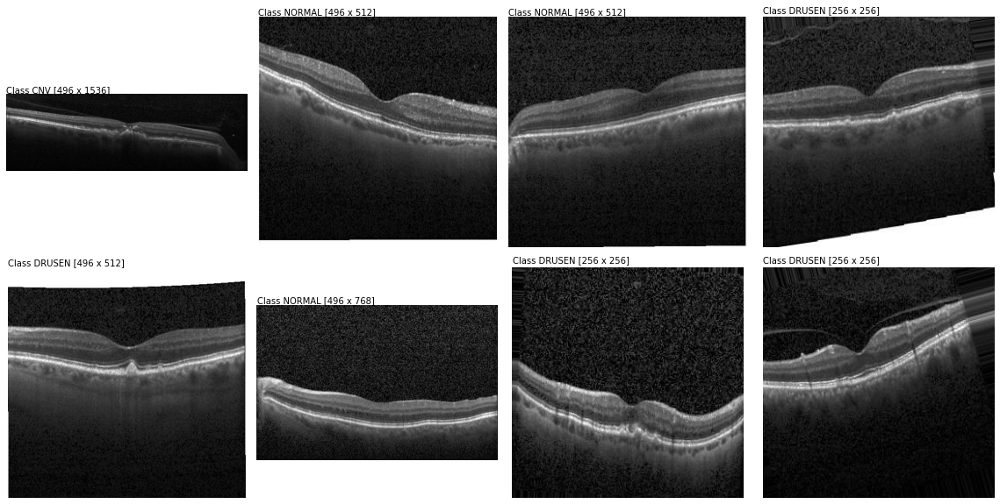

In [ ]:
def plot_images(images_df):
  sample = images_df.sample(n=8).reset_index()
  plt.figure(figsize=(16,16))
  # images are 96x96x3
  for i, row in sample.iterrows():
      try:
        filename = row.filepath
        img = tf.image.decode_jpeg(tf.io.read_file(filename),  channels=3)
        # print("The image resolution is ={}".format(img.shape))
        # img = tf.image.resize_with_pad(img, target_height=512, target_width=512)    
        label = '{} [{} x {}]'.format(row.oct_type , img.shape[0], img.shape[1]) 

        plt.subplot(4,4,i+1)
        plt.imshow(img)
        plt.text(0, -5, f'Class {label}', color='k')
            
        plt.axis('off')
      except Exception as e:
        s = str(e)
        print("Image not found: " + filename + "; Excpetion = " + s)

  plt.tight_layout()
  plt.show()
plot_images(train_df)

In [ ]:
IMAGE_SIZE = 256
imageDelegate=ImageDataGenerator(samplewise_center=True,samplewise_std_normalization=True)
data_gen = imageDelegate.flow_from_dataframe(train_df, x_col='filepath', y_col='oct_type',class_mode='categorical',batch_size=32,target_size=(IMAGE_SIZE,IMAGE_SIZE))

Found 89475 validated image filenames belonging to 4 classes.


In [ ]:
Labels={i:k for i, k in enumerate(list(data_gen.class_indices.keys())) }
def GetLabel(key):
    return Labels[key]
print(Labels)

{0: 'CNV', 1: 'DME', 2: 'DRUSEN', 3: 'NORMAL'}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

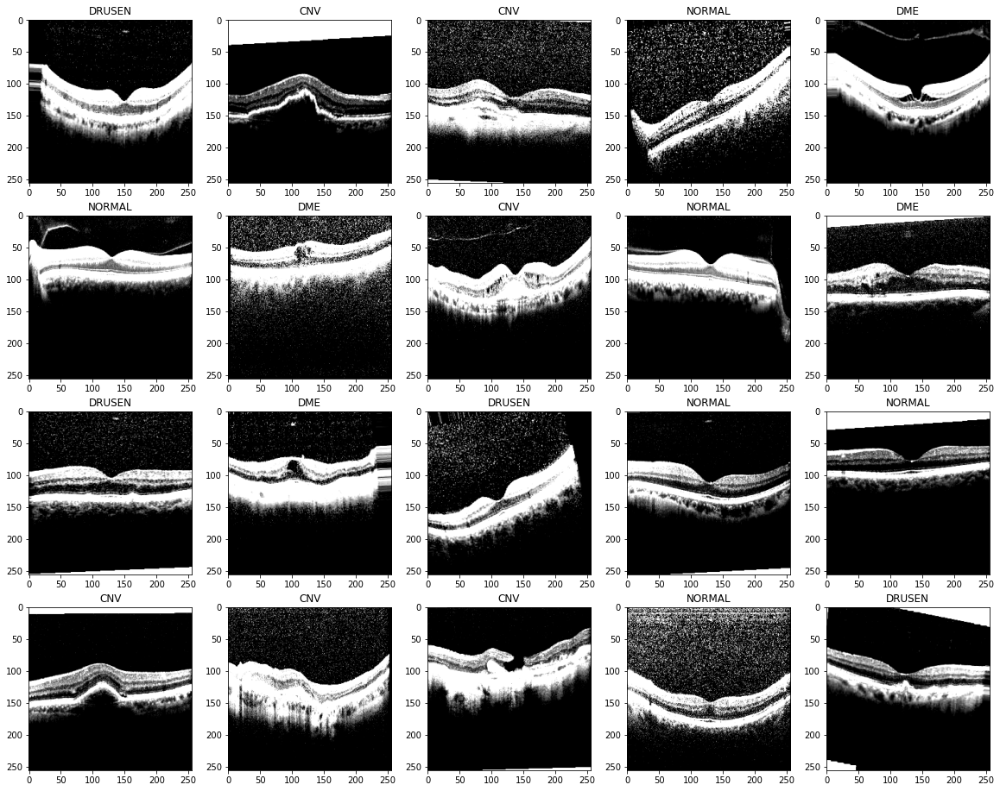

In [ ]:
plt.figure(figsize=(20,16))
for i  in range(20):
    plt.subplot(4,5,i+1)
    plt.imshow(data_gen.__getitem__(0)[0][i])
    plt.title(GetLabel(np.argmax(data_gen.__getitem__(0)[1][i])))

# 3.0 Create Training, Validation, and Test Sets

In [ ]:
# _train_df, test_df = train_test_split(balanced_df, test_size=0.2, random_state=42, stratify=balanced_df.oct_type)
# train_df, valid_df = train_test_split(_train_df, test_size=0.25, random_state=42, stratify=_train_df.oct_type) # 0.25 x 0.8 = 0.2
# print("train_df shape = {}".format(train_df.shape))
# print("valid_df shape = {}".format(valid_df.shape))
# print("test_df shape = {}".format(test_df.shape))

# 4.0 Create Image Data Generators

In [ ]:
TRAIN_BATCH_SIZE=32
VALIDATION_BATCH_SIZE=32
TEST_BATCH_SIZE =32

# https://theailearner.com/2019/07/06/data-augmentation-with-keras-imagedatagenerator/
# train_datagen = ImageDataGenerator(rescale=1./255,samplewise_center=True,samplewise_std_normalization=True, rotation_range=10., width_shift_range=0.1, height_shift_range=0.1, zoom_range=0.1, channel_shift_range=0.05, horizontal_flip=True) ## transformations are not providing better metrics
train_datagen = ImageDataGenerator(rescale=1./255,samplewise_center=True,samplewise_std_normalization=True)
validation_datagen = ImageDataGenerator(rescale=1./255,samplewise_center=True,samplewise_std_normalization=True)
test_datagen = ImageDataGenerator(rescale=1./255,samplewise_center=True,samplewise_std_normalization=True)

train_generator = train_datagen.flow_from_dataframe(train_df, x_col='filepath', y_col='oct_type',class_mode='categorical',batch_size=TRAIN_BATCH_SIZE,target_size=(IMAGE_SIZE,IMAGE_SIZE))
validation_generator = validation_datagen.flow_from_dataframe(valid_df, x_col='filepath', y_col='oct_type',class_mode='categorical',batch_size=VALIDATION_BATCH_SIZE,shuffle=False, target_size=(IMAGE_SIZE,IMAGE_SIZE))
test_generator = test_datagen.flow_from_dataframe(test_df, x_col='filepath', y_col='oct_type',class_mode='categorical',batch_size=TEST_BATCH_SIZE,shuffle=False,target_size=(IMAGE_SIZE,IMAGE_SIZE))

Found 89475 validated image filenames belonging to 4 classes.
Found 16528 validated image filenames belonging to 4 classes.
Found 16528 validated image filenames belonging to 4 classes.


### Let's see how images from one batch of ImageDataGenerator look

The image resolution is =(256, 256)


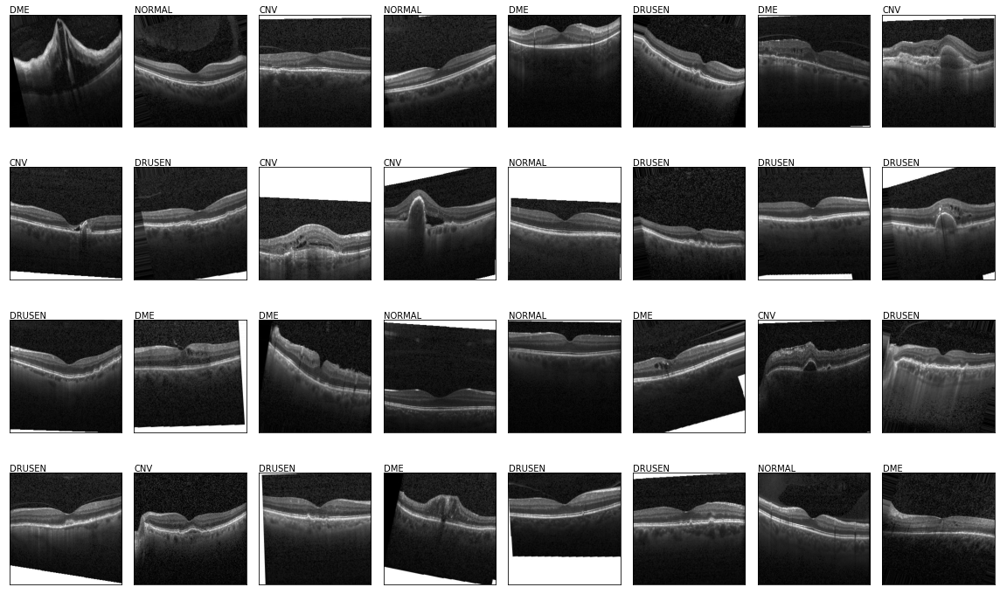

In [ ]:
plt.figure(figsize=(16,10))
batch = next(train_generator)
images = batch[0]
labels = batch[1]

for i in range(len(batch[0])):
    plt.subplot(4,8,i+1)
    img = images[i][:,:,0] 
    if i==0:
        print("The image resolution is ={}".format(img.shape))
    plt.imshow(img,cmap='gray')
    # print(labels[i])
    plt.text(0, -5, '{}'.format(GetLabel(np.argmax(labels[i]))), color='k')
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

# 5.0 Build and Train; and, Predict on Validation Set

Model-3: Vgg19/Resnet50/InceptionV3 Transfer-learning approach (#  reference https://chroniclesofai.com/transfer-learning-with-keras-resnet-50/)


In [ ]:
NUM_CLASSES = 4
model_name = 'VGG16'
def get_pretrained_model(_model_name):
  _pretrained_model = None
  if _model_name == 'RESNET50':
    _pretrained_model= tf.keras.applications.resnet50.ResNet50(include_top=False,
                    input_shape=(IMAGE_SIZE,IMAGE_SIZE,3),
                    pooling='avg',
                    weights='imagenet')
  elif _model_name == 'VGG19':
    _pretrained_model= tf.keras.applications.vgg19.VGG19(include_top=False,
                    input_shape=(IMAGE_SIZE,IMAGE_SIZE,3),
                    pooling='avg',
                    weights='imagenet')
  elif _model_name == 'INCEPTIONV3':
    _pretrained_model= tf.keras.applications.inception_v3.InceptionV3(include_top=False,
                    input_shape=(IMAGE_SIZE,IMAGE_SIZE,3),
                    pooling='avg',
                    weights='imagenet')
  elif _model_name == 'VGG16':
    _pretrained_model= tf.keras.applications.vgg16.VGG16(include_top=False,
                  input_shape=(IMAGE_SIZE,IMAGE_SIZE,3),
                  pooling='avg',
                  weights='imagenet')
  elif _model_name == 'DENSENET121':
    _pretrained_model= tf.keras.applications.densenet.DenseNet121(include_top=False,
                input_shape=(IMAGE_SIZE,IMAGE_SIZE,3),
                pooling='avg',
                weights='imagenet')
  elif _model_name == 'MOBILENETV2':
    _pretrained_model= tf.keras.applications.mobilenet_v2.MobileNetV2(include_top=False,
                input_shape=(IMAGE_SIZE,IMAGE_SIZE,3),
                pooling='avg',
                weights='imagenet')
  else:
    return 'No RetinalModel type specified'

  return _pretrained_model

In [ ]:
from keras.regularizers import l2
from keras.models import Sequential
from warnings import resetwarnings
def create_hp_oct_model(hp):
  hp_oct_model = Sequential()
  _pretrained_model = get_pretrained_model(model_name)
  # for i, layer in np.ndenumerate(pretrained_model.layers):
  #   # print(str(i) + ":" + layer.name)
  #   layer.trainable=False
  _pretrained_model.trainable = False
  # print(pretrained_model.summary())
  hp_oct_model.add(_pretrained_model)
  # hp_oct_model.add(tf.keras.layers.GlobalAveragePooling2D())

  hp_units_1 = hp.Int('units_1', min_value=256, max_value=512, step=128)
  hp_oct_model.add(tf.keras.layers.Dense(hp_units_1, activation='relu'))
  hp_drop_1 = hp.Float('dropout_1', min_value=0.2, max_value=0.5, default=0.2, step=0.1)
  hp_oct_model.add(tf.keras.layers.Dropout(hp_drop_1))
  # # vgg19_model.add(tf.keras.layers.BatchNormalization())

  hp_units_2 = hp.Int('units_2', min_value=128, max_value=256, step=64)
  hp_oct_model.add(tf.keras.layers.Dense(hp_units_2, activation='relu'))
  hp_drop_2 = hp.Float('dropout_2', min_value=0.2, max_value=0.5, default=0.2, step=0.1)
  hp_oct_model.add(tf.keras.layers.Dropout(hp_drop_2))
  # hp_oct_model.add(tf.keras.layers.BatchNormalization())

  hp_oct_model.add(tf.keras.layers.Dense(NUM_CLASSES, activation='softmax', name="predictions"))
  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
  hp_oct_model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),loss="categorical_crossentropy", metrics=["acc"])
  # vgg19_model.summary()
  # return ("Vgg19", vgg19_model, pretrained_model)
  #   The hyperparameter search is complete. The optimal number of units in the second Conv2D
  # layer is 512, the third Conv2D layers is 256, and the optimal learning rate for the optimizer
  # is 0.001.
  return hp_oct_model

def get_hyperparameters(_model_name):
  if _model_name == 'VGG16':
    return (384, 256, 0.5, 0.3, 0.001)
  elif _model_name == 'INCEPTIONV3':
    return (512, 256, 0.4, 0.2, 0.001)
    # return (256, 192, 0.3, 0.2, 0.0001) #ht-tuned on 4/5/2022
  else:
    return (512, 256, 0.4, 0.2, 0.001) 


def create_oct_model():
  oct_model = Sequential()
  _pretrained_model = get_pretrained_model(model_name)
  # for i, layer in np.ndenumerate(pretrained_model.layers):
  #   # print(str(i) + ":" + layer.name)
  #   layer.trainable=False
  _pretrained_model.trainable = False
  # print(pretrained_model.summary())
  oct_model.add(_pretrained_model)
  # oct_model.add(layers.GlobalAveragePooling2D())
  unit_1, unit_2, dropout_1, dropout_2, lr = get_hyperparameters(model_name)
  oct_model.add(layers.Dense(unit_1, activation='relu'))
  oct_model.add(layers.Dropout(dropout_1))
  # # oct_model.add(layers.BatchNormalization())

  oct_model.add(layers.Dense(unit_2, activation='relu'))
  oct_model.add(layers.Dropout(dropout_2))
  # oct_model.add(layers.BatchNormalization())

  oct_model.add(layers.Dense(NUM_CLASSES, activation='softmax', name="predictions"))
  oct_model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=lr),loss="categorical_crossentropy", metrics=["acc"])
  oct_model.summary()
  return (oct_model, _pretrained_model)

def save_model(_model, _model_name):
  todayS = datetime.now().strftime("%m%d%Y-%H-%M")
  # Save Model On GDrive
  
  gdrive_model_save_path=MODEL_gdrive_dir + "/Retinal_OCT_" +_model_name + "-" +todayS
  _model.save(gdrive_model_save_path)
  # Save Model Locally also
  model_directory = 'oct/model'
  _model.save(model_directory + '/Retinal_OCT_'+_model_name + "-" + todayS)
  return gdrive_model_save_path

def create_tflite_model(full_model_save_path):
  converter = tf.lite.TFLiteConverter.from_saved_model(full_model_save_path) # [YOUR CODE HERE]
  converter.optimizations = [tf.lite.Optimize.DEFAULT]
  converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS, # enable TensorFlow Lite ops.
    tf.lite.OpsSet.SELECT_TF_OPS # enable TensorFlow ops.
  ]  
  tflite_model = converter.convert()
  return tflite_model

def save_model_tflite(full_model_save_path):
  tflite_model = create_tflite_model(full_model_save_path)
  tflite_model_save_path = full_model_save_path + ".tflite"
  with open(tflite_model_save_path, "wb") as f:
    # [YOUR CODE HERE]
    f.write(tflite_model)
  return tflite_model_save_path


## Hyper tuning using KerasTuner

In [ ]:
!pip install -q -U keras-tuner

     |████████████████████████████████| 133 kB 14.4 MB/s 


In [ ]:
#!rm -rf ht_logs

In [ ]:
import keras_tuner as kt
def do_hyper_tuning():
  tuner = kt.Hyperband(create_hp_oct_model,
                      objective='val_acc',
                      max_epochs=20,
                      factor=3,
                      directory='ht_logs',
                      project_name='oct_kt')
  stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
  tuner.search(train_generator, epochs=50, validation_data=validation_generator, callbacks=[stop_early])

  # Get the optimal hyperparameters
  best_hps=tuner.get_best_hyperparameters(num_trials=1)[0]

  print(f"""
  The hyperparameter search is complete. The optimal number of units in the second Conv2D
  layer is {best_hps.get('units_1')}, the third Conv2D layers is {best_hps.get('units_2')},
  best dropout_1 is {best_hps.get('dropout_1')}, and dropout_2 is {best_hps.get('dropout_2')},
   and the optimal learning rate for the optimizer
  is {best_hps.get('learning_rate')}.
  """)
  
  return tuner

In [ ]:
# tf.keras.backend.clear_session()
# tuner =  do_hyper_tuning()
# best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
# print(f"""
#   The {model_name} hyperparameter search is complete. The optimal number of units in the second Conv2D
#   layer is {best_hps.get('units_1')}, the third Conv2D layers is {best_hps.get('units_2')},
#   best dropout_1 is {best_hps.get('dropout_1')}, and dropout_2 is {best_hps.get('dropout_2')},
#    and the optimal learning rate for the optimizer
#   is {best_hps.get('learning_rate')}.
#   """)
# tuner.search_space_summary()

## Select Model

## TransferLearning

In [ ]:
def do_transfer_learning(_model_name, _model, _pretrained_model,_train_generator, _validation_generator, num_epochs, early_stopping_callback, tensorboard_callback):
  print("Running transfer-learning model: "+ model_name)
  TRAIN_STEPS_PER_EPOCH = np.floor(_train_generator.samples/_train_generator.batch_size) +1
  print("TRAIN_STEPS_PER_EPOCH = " + str(TRAIN_STEPS_PER_EPOCH))
  _history = _model.fit(_train_generator, validation_data = _validation_generator, epochs=10, verbose=1,callbacks=[early_stopping_callback])
  #code for finetuning
  # Unfreeze the base_model. Note that it keeps running in inference mode
  # since we passed `training=False` when calling it. This means that
  # the batchnorm layers will not update their batch statistics.
  # This prevents the batchnorm layers from undoing all the training
  # we've done so far.
  initial_learning_rate = 5e-6
  lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate, decay_steps=TRAIN_STEPS_PER_EPOCH, decay_rate=0.9, staircase=True)
  _pretrained_model.trainable = True
  _pretrained_model.summary()
  _model.summary()
  _metrics = ['acc', tf.keras.metrics.AUC(),
                tf.keras.metrics.Precision(), 
                tf.keras.metrics.Recall()]
  _model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule),loss="categorical_crossentropy", metrics=_metrics) 
  
  history = _model.fit(_train_generator, validation_data = _validation_generator, epochs=num_epochs, verbose=1, callbacks=[early_stopping_callback,tensorboard_callback])
  return history

In [ ]:
# model_name, model, pretrained_model = create_Vgg19_Model()

# keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

## Fit Data

In [ ]:
from datetime import datetime
logdir = "logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

tf.keras.backend.clear_session()
model, pretrained_model = create_oct_model()
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_acc', mode='max', patience=4, restore_best_weights=True)
history = do_transfer_learning(model_name, model, pretrained_model,train_generator, validation_generator, 30, early_stopping_callback,tensorboard_callback)
gdrive_model_save_path = save_model(model, model_name)
save_model_tflite(gdrive_model_save_path)
print("final learning rate ={}".format(model.optimizer._decayed_lr(tf.float32).numpy()))


29097984/29084464 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 1024)              7037504   
                                                                 
 module_wrapper (ModuleWrapp  (None, 512)              524800    
 er)                                                             
                                                                 
 module_wrapper_1 (ModuleWra  (None, 512)              0         
 pper)                                                           
                                                                 
 module_wrapper_2 (ModuleWra  (None, 256)              131328    
 pper)                                                           
                                                                 
 module_wrapper_3 (ModuleWra  (None, 256)              0 

Layer ModuleWrapper has arguments ['self', 'module', 'method_name']
in `__init__` and therefore must override `get_config()`.

Example:

class CustomLayer(keras.layers.Layer):
    def __init__(self, arg1, arg2):
        super().__init__()
        self.arg1 = arg1
        self.arg2 = arg2

    def get_config(self):
        config = super().get_config()
        config.update({
            "arg1": self.arg1,
            "arg2": self.arg2,
        })
        return config


Epoch 1/30
2817/2817 [==============================] - 514s 178ms/step - loss: 0.4233 - acc: 0.8567 - auc: 0.9703 - precision: 0.8723 - recall: 0.8418 - val_loss: 0.2244 - val_acc: 0.9247 - val_auc: 0.9911 - val_precision: 0.9344 - val_recall: 0.9133
Epoch 2/30
2817/2817 [==============================] - 500s 177ms/step - loss: 0.1993 - acc: 0.9326 - auc: 0.9916 - precision: 0.9387 - recall: 0.9262 - val_loss: 0.1728 - val_acc: 0.9457 - val_auc: 0.9947 - val_precision: 0.9527 - val_recall: 0.9379
Epoch 3/30
2817/2817 [==============================] - 500s 178ms/step - loss: 0.1437 - acc: 0.9514 - auc: 0.9952 - precision: 0.9556 - recall: 0.9478 - val_loss: 0.1517 - val_acc: 0.9521 - val_auc: 0.9957 - val_precision: 0.9568 - val_recall: 0.9462
Epoch 4/30
2817/2817 [==============================] - 499s 177ms/step - loss: 0.1095 - acc: 0.9624 - auc: 0.9971 - precision: 0.9651 - recall: 0.9597 - val_loss: 0.1352 - val_acc: 0.9565 - val_auc: 0.9964 - val_precision: 0.9602 - val_recall:

INFO:tensorflow:Assets written to: drive/MyDrive/Deepak/FourthBrain/MachineLearningEngineerCourse/Capstone/Retinal-OCT/model/Retinal_OCT_DENSENET121-05242022-00-10/assets


INFO:tensorflow:Assets written to: drive/MyDrive/Deepak/FourthBrain/MachineLearningEngineerCourse/Capstone/Retinal-OCT/model/Retinal_OCT_DENSENET121-05242022-00-10/assets


INFO:tensorflow:Assets written to: oct/model/Retinal_OCT_DENSENET121-05242022-00-10/assets


INFO:tensorflow:Assets written to: oct/model/Retinal_OCT_DENSENET121-05242022-00-10/assets


final learning rate =8.338586781064805e-07


dict_keys(['loss', 'acc', 'auc', 'precision', 'recall', 'val_loss', 'val_acc', 'val_auc', 'val_precision', 'val_recall'])
17


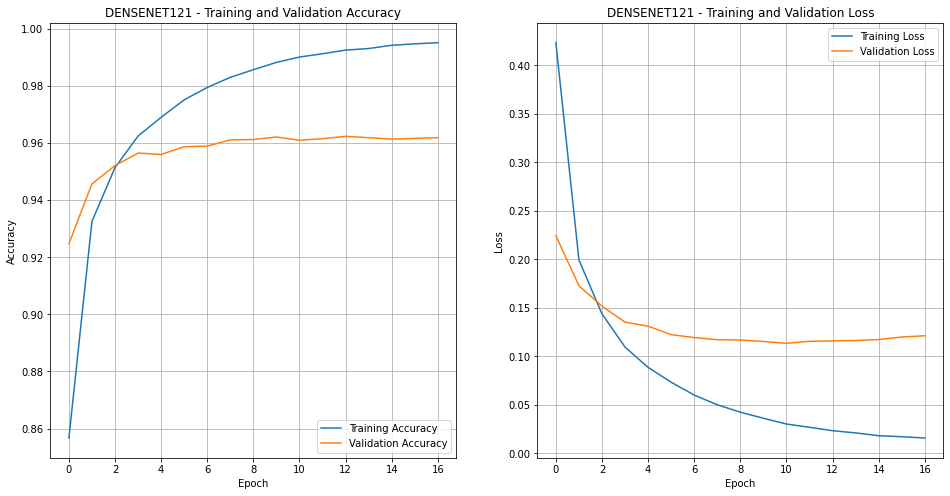

In [ ]:
def get_training_metrics(history):
  print(history.history.keys())
  acc = history.history['acc']
  val_acc = history.history['val_acc']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs_range = range(len(history.history['loss']))
  print(len(history.history['loss']))
  return acc, val_acc, loss, val_loss,epochs_range

def plot_train_eval(history):
  acc, val_acc, loss, val_loss,epochs_range = get_training_metrics(history)
  plt.figure(figsize=(16, 8))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.grid(which='both')
  plt.ylabel("Accuracy")
  plt.xlabel("Epoch")
  plt.title('{} - Training and Validation Accuracy'.format(model_name))

  plt.subplot(1, 2, 2)
  plt.plot(epochs_range,  loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  # plt.yscale("log")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.legend(loc='upper right')
  plt.grid(which='both')
  plt.title('{} - Training and Validation Loss'.format(model_name))
  plt.show()
plot_train_eval(history)

### Add tensorboard capabilities to monitor model performance

In [ ]:
%tensorboard --logdir logs

Output hidden; open in https://colab.research.google.com to view.

## Predict on test_df images

The performance of the algorithm was measured by the area under the receiver operating curve (AUC) generated by plotting sensitivity vs 1 − specificity. Because the network in this study had a large number of parameters (22 million), an early stopping criteria18 (that stops training when peak AUC is reached on a separate tuning set) was used to terminate training before convergence. The development set was divided into 2 parts: (1) training: 80% of the data was used to optimize the network weights and (2) tuning: 20% of the data was used to optimize hyperparameters (such as early stopping for training, image preprocessing options). An ensemble19 of 10 networks trained on the same data was used, and the final prediction was computed by a linear average over the predictions of the ensemble.



In [ ]:
# model = tf.keras.models.load_model(MODEL_gdrive_dir + "/Retinal_OCT_RESNET50-05212022-14-33")
# model_name ="RESNET50"
# print(model.summary())

In [ ]:
metrics = model.evaluate(test_generator, verbose=2, return_dict=True)
print('{} - Test-Data {}'.format(model_name, metrics))

522/522 - 74s - loss: 0.1192 - acc: 0.9617 - auc: 0.9955 - precision: 0.9627 - recall: 0.9607 - 74s/epoch - 143ms/step
DENSENET121 - Test-Data {'loss': 0.1192106232047081, 'acc': 0.9616720676422119, 'auc': 0.9954679608345032, 'precision': 0.9626740217208862, 'recall': 0.9607138633728027}


In [ ]:
pred = model.predict(test_generator)

In [ ]:
true_classes = test_generator.classes
predicted_classes = np.argmax(pred, axis=1)
import sklearn
report = sklearn.metrics.classification_report(true_classes, predicted_classes, target_names = list(test_generator.class_indices.keys()))
print(report)

              precision    recall  f1-score   support

         CNV       0.97      0.98      0.97      7441
         DME       0.97      0.94      0.95      2270
      DRUSEN       0.88      0.87      0.88      1723
      NORMAL       0.97      0.98      0.98      5264

    accuracy                           0.96     16698
   macro avg       0.95      0.94      0.94     16698
weighted avg       0.96      0.96      0.96     16698



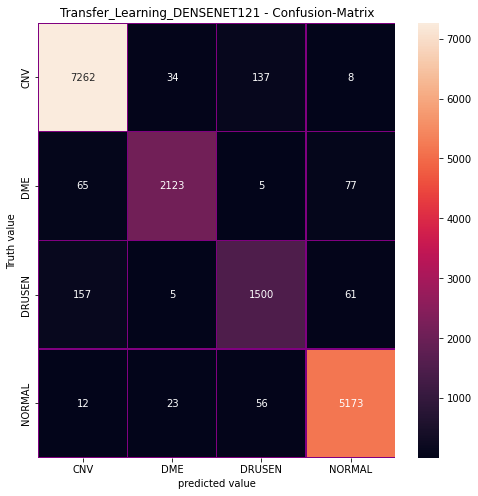

In [ ]:
heat_map_labels = list(test_generator.class_indices.keys())
cm = sklearn.metrics.confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(8,8))
sns.heatmap(cm, fmt='.0f', annot=True, linewidths=0.2, linecolor='purple',xticklabels=heat_map_labels, yticklabels=heat_map_labels)
plt.xlabel('predicted value')
plt.ylabel('Truth value')
plt.title('Transfer_Learning_{} - Confusion-Matrix'.format(model_name))
plt.show()

https://towardsdatascience.com/multi-class-classification-extracting-performance-metrics-from-the-confusion-matrix-b379b427a872

#**AI Explainability**

In [ ]:
model = tf.keras.models.load_model(MODEL_gdrive_dir + "/Retinal_OCT_VGG16-05212022-08-05")
model_name ="VGG16"
# print(model.summary())

In [ ]:
import matplotlib.image as mpimg
CNV_img_path = (test_df[test_df['oct_type'] =='CNV']).iloc[21,3]
DME_img_path = (test_df[test_df['oct_type'] =='DME']).iloc[25,3]
DRUSEN_img_path = (test_df[test_df['oct_type'] =='DRUSEN']).iloc[11,3]
NORMAL_img_path = (test_df[test_df['oct_type'] =='NORMAL']).iloc[35,3]
# CNV_img_path = './demo/{}.jpeg'.format('CNV-779442-1')
# DME_img_path = './demo/{}.jpeg'.format('DME-323904-2')
# DRUSEN_img_path = './demo/{}.jpeg'.format('DRUSEN-1225603-2')
# NORMAL_img_path = './demo/{}.jpeg'.format('NORMAL-285896-1')
img_paths = [CNV_img_path,DME_img_path,DRUSEN_img_path, NORMAL_img_path]
titles = ['CNV', 'DME', 'DRUSEN','NORMAL']

img1 = tf.keras.preprocessing.image.load_img(img_paths[0], target_size=(256,256))
img2 = tf.keras.preprocessing.image.load_img(img_paths[1], target_size=(256,256))
img3 = tf.keras.preprocessing.image.load_img(img_paths[2], target_size=(256,256))
img4 = tf.keras.preprocessing.image.load_img(img_paths[3], target_size=(256,256))
images = np.asarray([np.array(img1), np.array(img2), np.array(img3), np.array(img4)])

X = tf.keras.applications.vgg16.preprocess_input(images)

## Vanilla Saliency

In [ ]:
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.utils import normalize
def model_modifier(m):
  m.layers[-1].activation = tf.keras.activations.linear
  return m

# # Output of model
def loss(output):
  # print(output)
  return (output[0][0], output[1][1], output[2][2], output[3][3])

saliency = Saliency(model, model_modifier=model_modifier, clone=False)

saliency_map = saliency(loss, X)
saliency_map = normalize(saliency_map)
subplot_args = {'nrows': 1, 'ncols': 4, 'figsize': (12,3),}
# f, ax = plt.subplots(**subplot_args)
# # f, ax = plt.subplots(**subplot_args)
# for i in range(4):
#     ax[i].set_title(titles[i], fontsize=14)
#     ax[i].imshow(images[i])
# plt.tight_layout()
# plt.show()

# f, ax = plt.subplots(**subplot_args)
# for i in range(4):
#     ax[i].set_title(titles[i], fontsize=14)
#     ax[i].imshow(saliency_map[i], cmap='jet')
# plt.tight_layout()
# plt.show()

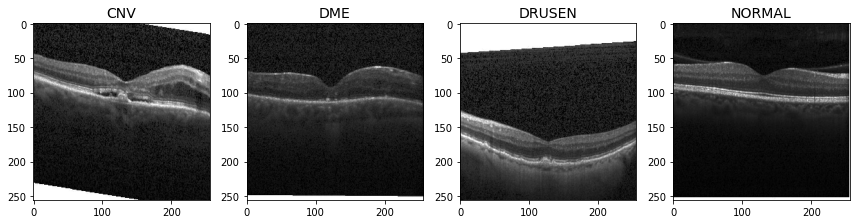

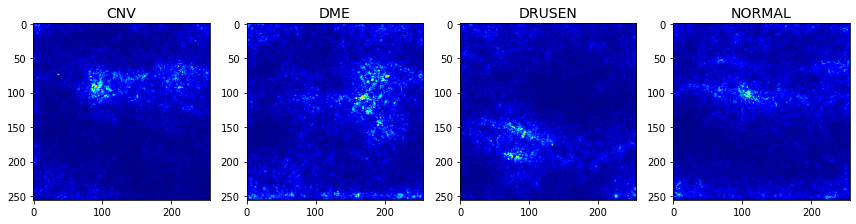

In [ ]:
saliency_map = saliency(loss,
                       X,
                       smooth_samples=30,
                       smooth_noise=0.4)
saliency_map = normalize(saliency_map)

f, ax = plt.subplots(**subplot_args)
for i in range(4):
    ax[i].set_title(titles[i], fontsize=14)
    ax[i].imshow(images[i])
plt.tight_layout()
plt.show()

f, ax = plt.subplots(**subplot_args)
for i in range(4):
    ax[i].set_title(titles[i], fontsize=14)
    ax[i].imshow(saliency_map[i], cmap='jet')
plt.tight_layout()
plt.show()

##Interpreting the Prediction of Pre-trained Model with LIME
https://github.com/marcotcr/lime

 On the left image, we can see that only the super-pixels where the given class-category is visible are shown. This means that our model classifies our image as a the class-category because of these parts of super-pixels.

On the right image, the area of super-pixels colored in green are the ones that increase the probability of our image belongs to the given class, while the super-pixels colored in red are the ones that decrease the probability.

In [ ]:
demo_files = ['CNV-779442-1','DME-323904-2','DRUSEN-1225603-2', 'NORMAL-285896-1']
def demo_file_exists(filename):
    filename_only, file_extension = os.path.splitext(filename)
    print(filename_only)    
    return filename_only in demo_files
if demo_file_exists('DME-323904-2.png'):
  print("file exists")
else:
  print("file does not exist")

DME-323904-2
file exists


  0%|          | 0/2000 [00:00<?, ?it/s]

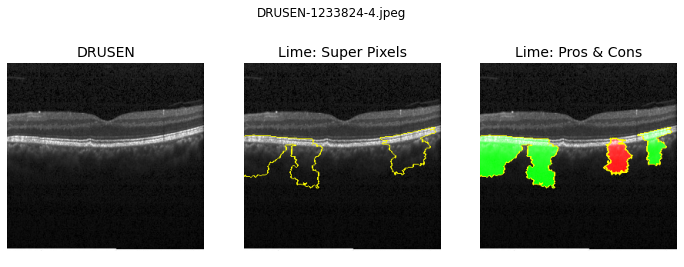

In [ ]:
from skimage.segmentation import mark_boundaries
from lime import lime_image

def do_lime_explaination(img, img_name,input_image_file_name):
  explainer = lime_image.LimeImageExplainer()  
  # print(tf.shape(np.array(img1)))
  explanation = explainer.explain_instance(img, model.predict,top_labels=3, hide_color=0, num_samples=2000)
  # explanation = explainer.explain_instance(images[_index], model.predict)
  temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=4, hide_rest=False) # num_features=5
  temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=4, hide_rest=False)# num_features=10

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,4.5))
  ax1.imshow(img)
  ax1.set_title(img_name, fontsize=14)
  ax2.imshow(mark_boundaries(temp_1, mask_1))
  ax2.set_title('Lime: Super Pixels', fontsize=14)
  ax3.imshow(mark_boundaries(temp_2, mask_2))
  ax3.set_title('Lime: Pros & Cons', fontsize=14)
  ax1.axis('off')
  ax2.axis('off')
  ax3.axis('off')
  fig.suptitle(input_image_file_name)
  # plt.title(img_paths[_index])
  filename, file_extension = os.path.splitext(input_image_file_name)
  plt.savefig('EXPLAIN-{}.png'.format(filename))
  plt.show()
_index =2
path, filename = os.path.split(img_paths[_index])
do_lime_explaination(images[_index], titles[_index], filename)

In [ ]:
lsTest = []
for i in range(3):
  ret_val = {}
  ret_val['Model'] = 'A_{}'.format(i)
  ret_val['Prediction-Class'] = 'a_name_{}'.format(i)
  ret_val['Prediction-Score'] = "{:.2%}".format(0.98765432)
  lsTest.append(ret_val)
print(lsTest[2]['Prediction-Class'])

a_name_2


# TFLite Predictions

In [ ]:
tflite_model_file = os.path.join(MODEL_gdrive_dir, 'Retinal_OCT_VGG19-05192022-22-02.tflite')
with open(tflite_model_file, 'rb') as fid:
    tflite_model = fid.read()

interpreter = tf.lite.Interpreter(model_content=tflite_model)
interpreter.allocate_tensors()

input_index = interpreter.get_input_details()[0]["index"]
output_index = interpreter.get_output_details()[0]["index"]

In [ ]:
test_df.head()

,analysis_type,oct_type,filename,filepath
63241,train,NORMAL,NORMAL-7785011-6.jpeg,/content/oct/data/OCT2017/train/NORMAL/NORMAL-...
13107,train,CNV,CNV-1699976-128.jpeg,/content/oct/data/OCT2017/train/CNV/CNV-169997...
41437,train,CNV,CNV-3976600-33.jpeg,/content/oct/data/OCT2017/train/CNV/CNV-397660...
14103,train,CNV,CNV-9005459-71.jpeg,/content/oct/data/OCT2017/train/CNV/CNV-900545...
61165,train,NORMAL,NORMAL-6503441-13.jpeg,/content/oct/data/OCT2017/train/NORMAL/NORMAL-...


In [ ]:
image_path = test_df.iloc[0,1]
print(image_path)

NORMAL


In [ ]:
from tqdm import tqdm
from keras.preprocessing import image
class_names = ['CNV', 'DME', 'DRUSEN', 'NORMAL']
predictions = []

test_labels, test_imgs = [], []
for i in range(10):
  image_path = test_df.iloc[i,3]
  image_label = test_df.iloc[i,1]
  new_img = image.load_img(image_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
  img = image.img_to_array(new_img)
  img = np.expand_dims(img, axis=0)
  img = img/255
  img = np.array(img, dtype=np.float32)
  interpreter.set_tensor(input_index, img)
  interpreter.invoke()
  predictions.append(class_names[np.argmax(interpreter.get_tensor(output_index))])
  test_labels.append(image_label)
  test_imgs.append(img)

In [ ]:
print(predictions)

['DRUSEN', 'CNV', 'CNV', 'CNV', 'CNV', 'DRUSEN', 'DME', 'NORMAL', 'CNV', 'CNV']


In [ ]:
print(test_labels)

['DRUSEN', 'CNV', 'CNV', 'CNV', 'DRUSEN', 'DRUSEN', 'NORMAL', 'NORMAL', 'CNV', 'CNV']


In [ ]:
target_names = list(test_generator.class_indices.keys())
print(target_names)

['CNV', 'DME', 'DRUSEN', 'NORMAL']


In [ ]:
#@title Utility functions for plotting
# Utilities for plotting
import matplotlib.pyplot as plt
import numpy as np



def plot_image(i, predictions_array, true_label, img):
    predictions_array, true_label, img = predictions_array[i], true_label[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    
    img = np.squeeze(img)

    plt.imshow(img, cmap=plt.cm.binary)

    predicted_label = np.argmax(predictions_array)
    print(type(predicted_label), type(true_label))
    if predicted_label == true_label:
        color = 'green'
    else:
        color = 'red'
  
    plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                  100 * np.max(predictions_array),
                                  class_names[true_label]),
                                  color=color)

<class 'numpy.int64'> <class 'str'>


TypeError: ignored

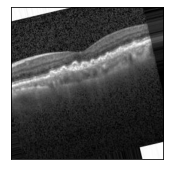

In [ ]:
#@title Visualize the outputs { run: "auto" }
index = 0 #@param {type:"slider", min:0, max:9, step:1}
plt.figure(figsize=(6, 3))
plt.subplot(1, 2, 1)
plot_image(index, predictions, test_labels, test_imgs)
plt.show()